In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
from glob import glob
import seaborn as sns

from scipy.stats import pearsonr
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
from matplotlib import colors
from scipy.stats import linregress

In [2]:

def IOA_Loss_np(o, p):
    ioa = 1 - (np.sum((o - p) ** 2)) / (
        np.sum((np.abs(p - np.mean(o)) + np.abs(o - np.mean(o))) ** 2)
    )
    return ioa


In [3]:

def plot_scatter_with_fit(ax, x, y, xlabel, ylabel, title, fig=None, metrics=None, var=None, xmax=None, ymax=None):
    """
    Creates an enhanced hexbin scatter plot with regression line and statistics.
    
    Parameters:
    -----------
    ax : matplotlib.axes.Axes
        The axes to plot on
    x, y : array-like
        Data to plot
    xlabel, ylabel : str
        Labels for axes
    title : str
        Plot title
    fig : matplotlib.figure.Figure
        Figure object for colorbar reference
    metrics : dict
        Dictionary containing statistical metrics
    var : str
        Variable name for metrics lookup ('model' or 'tempo')
    """
    # Extract metrics with safety checks
    mab = metrics.get(f'mab_{var}', 0)
    rmse = metrics.get(f'rmse_{var}', 0)
    IOA = metrics.get(f'ioa_{var}', 0)
    
    # Set up the hexbin plot with improved colors
    ax.set_aspect('equal')
    
    # Create hexbin with enhanced visuals
    hb = ax.hexbin(x, y, gridsize=150, cmap='turbo', 
                  norm=colors.LogNorm(vmin=1, vmax=None), 
                  mincnt=1, alpha=0.95, linewidths=0)
    
    # Add identity line (1:1)
    # max_value = max(max(x), max(y))  # Add 5% margin
    max_value = max(x) + 0.25 * max(x)  # Add 5% margin
    # max_value = 1.05e17
    ax.plot([0, max_value], [0, max_value], linestyle='--', color='gray', 
            linewidth=1.5, alpha=0.8, label='1:1 Line')
    
    # Calculate and add regression line
    slope, intercept, r_value, p_value, std_err = linregress(x, y)
    x_line = np.linspace(0, max_value, 100)
    ax.plot(x_line, slope * x_line + intercept, color='#d62728', 
            linewidth=2, label=f'Fit (y = {slope:.2f}x + {intercept:.2e})')
    
    # Set axis limits with margin
    ax.set_xlim([0, max_value])
    ax.set_ylim([0, max_value])
    
    # Create statistics box
    stats_text = (
        f"$R^2$ = {r_value**2:.3f}\n"
        f"IOA = {IOA:.3f}\n"
        f"Slope = {slope:.3f}\n"
        f"MAB = {mab:.3f} × $10^{{15}}$ molec/cm$^2$\n"
        f"n = {len(x):,}"
    )
    
    # Add statistics text box with background
    props = dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.6)
    ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, va='top', 
            bbox=props, fontsize=13)
    
    # Enhance colorbar
    if fig is not None:
        cb = fig.colorbar(hb, ax=ax, fraction=0.046, pad=0.04) 
        cb.set_label('Count', fontweight='bold', fontsize=12)
        cb.ax.tick_params(length=6, width=1)
        
    # Enhance labels
    ax.set_xlabel(xlabel,fontsize=13, fontweight='bold')
    ax.set_ylabel(ylabel,fontsize=13, fontweight='bold')
    ax.set_title(title, fontweight='bold', fontsize=14)
    ax.tick_params(axis='both', labelsize=12)
    # Add grid for better readability
    ax.grid(True, linestyle='--', alpha=0.5)
    
    # Add legend for lines
    ax.legend(loc='lower right', framealpha=0.8, fontsize=13)
    
    # Format ticks with scientific notation when appropriate
    if max_value > 1e16:
        ax.ticklabel_format(style='sci', axis='both', scilimits=(0,0))

def metrics_and_plot(preds, targets, tempo):
 
    # Calculate metrics
    r2_model = pearsonr(preds, targets)[0] ** 2
    r2_tempo = pearsonr(tempo, targets)[0] ** 2

    # Mean Absolute Bias (MAB)
    mab_model = np.mean(np.abs(preds - targets)) / 1e15  # Normalize to 10^15
    mab_tempo = np.mean(np.abs(tempo - targets)) / 1e15

    # Root Mean Squared Error (RMSE)
    rmse_model = np.sqrt(mean_squared_error(preds, targets)) / 1e15
    rmse_tempo = np.sqrt(mean_squared_error(tempo, targets)) / 1e15

    # Normalized MAB and RMSE
    target_mean = np.mean(targets)
    nmab_model = mab_model * 1e15 / target_mean if target_mean != 0 else np.nan
    nmab_tempo = mab_tempo * 1e15 / target_mean if target_mean != 0 else np.nan
    nrmse_model = rmse_model * 1e15 / target_mean if target_mean != 0 else np.nan
    nrmse_tempo = rmse_tempo * 1e15 / target_mean if target_mean != 0 else np.nan

    # Index of Agreement
    ioa_model = IOA_Loss_np(targets, preds)
    ioa_tempo = IOA_Loss_np(targets, tempo)
    
    slope_model, intercept, r_value, p_value, std_err = linregress(targets, preds)
    slope_tempo, intercept, r_value, p_value, std_err = linregress(targets, tempo)
    
    # Store metrics in dictionary
    metrics = {
        'r2_model': r2_model,
        'r2_tempo': r2_tempo,
        'slope_model': slope_model,
        'slope_tempo': slope_tempo,
        'ioa_model': ioa_model,
        'ioa_tempo': ioa_tempo,
        'mab_model': mab_model,
        'mab_tempo': mab_tempo,
        'rmse_model': rmse_model,
        'rmse_tempo': rmse_tempo,
        'nmab_model': nmab_model,
        'nmab_tempo': nmab_tempo,
        'nrmse_model': nrmse_model,
        'nrmse_tempo': nrmse_tempo,
    }
    
    # Create enhanced figure with better spacing
    fig, ax = plt.subplots(1, 2, figsize=(16, 8), dpi=300)
    with plt.style.context('seaborn-v0_8-whitegrid'):
        plot_scatter_with_fit(
            ax[0], targets, preds, 
            r"Pandora NO$_2$ column (×$10^{15}$ molec/cm$^2$)", 
            r"Model NO$_2$ column (×$10^{15}$ molec/cm$^2$)", 
            'Pandora vs Model', fig=fig, metrics=metrics, var='model'
        )
        
        plot_scatter_with_fit(
            ax[1], targets, tempo, 
            r"Pandora NO$_2$ column (×$10^{15}$ molec/cm$^2$)", 
            r"TEMPO NO$_2$ column (×$10^{15}$ molec/cm$^2$)", 
            'Pandora vs Tempo', fig=fig, metrics=metrics, var='tempo'
        )
    

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    
    return fig, metrics

def plot_cv_results_bar(df, title):
    
    metrics = ['r2', 'ioa', 'mab', 'rmse', 'nmab', 'nrmse']
    metric_labels = {
        'r2': r'$R^2$', 
        'ioa': 'IOA', 
        'mab': 'MAB', 
        'rmse': 'RMSE',
        'nmab': 'NMAB', 
        'nrmse': 'NRMSE'
    }
    
    with plt.style.context('seaborn-v0_8'):
        fig, axes = plt.subplots(2, 3, figsize=(18, 10))
        axes = axes.flatten()
        
        # Define a better colorblind-friendly palette
        model_color = '#1f77b4'  # Blue
        tempo_color = '#ff7f0e'  # Orange
        
        # Set figure background
        fig.patch.set_facecolor('white')
        
        # Add main title with better styling
        fig.suptitle(title, fontsize=16, fontweight='bold', y=0.98)

        for i, metric in enumerate(metrics):
            ax = axes[i]
            model_col = f'{metric}_model'
            tempo_col = f'{metric}_tempo'

            model_mean = df[model_col].mean()
            tempo_mean = df[tempo_col].mean()
            model_std = df[model_col].std()
            tempo_std = df[tempo_col].std()

            # Convert to percentage if nmab or nrmse
            if metric in ['nmab', 'nrmse']:
                model_mean *= 100
                tempo_mean *= 100
                model_std *= 100
                tempo_std *= 100

            # Enhanced bar plot
            width = 0.35
            x_pos = np.array([0, 1])
            
            # Create bars with error bars
            bars = ax.bar(
                x_pos, 
                [model_mean, tempo_mean], 
                width=width,
                yerr=[model_std, tempo_std], 
                capsize=4, 
                color=[model_color, tempo_color],
                edgecolor='black',
                linewidth=1,
                alpha=0.85,
                error_kw={'elinewidth': 1.5, 'capthick': 1.5}
            )
            
            # Add value labels on top of bars
            for bar, value, std in zip(bars, [model_mean, tempo_mean], [model_std, tempo_std]):
                if metric in ['r2', 'ioa']:
                    value_text = f"{value:.3f}\n±{std:.3f}"
                else:
                    value_text = f"{value:.2f}\n±{std:.2f}"
                ax.text(
                    bar.get_x() + bar.get_width()/2, 
                    bar.get_height() + std + (0.02 * max(model_mean, tempo_mean)),
                    value_text, 
                    ha='center', 
                    va='bottom', 
                    fontsize=9
                )

            # Set x-axis labels
            ax.set_xticks(x_pos)
            ax.set_xticklabels(['Model', 'TEMPO'], fontweight='bold', fontsize=11)
            
            # Format y-axis
            ax.tick_params(axis='y', labelsize=12)
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            
            # Set gridlines for better readability
            ax.grid(axis='y', linestyle='--', alpha=0.3)
            
            # Set appropriate title and y-label with units
            title_text = metric_labels[metric]
            if metric == 'mab':
                title_text = r'MAB (×10$^{15}$ molec/cm$^2$)'
                ax.set_ylabel(r'MAB (×10$^{15}$ molec/cm$^2$)', fontweight='bold')
            elif metric == 'rmse':
                title_text = r'RMSE (×10$^{15}$ molec/cm$^2$)'
                ax.set_ylabel(r'RMSE (×10$^{15}$ molec/cm$^2$)', fontweight='bold')
            elif metric in ['nmab', 'nrmse']:
                title_text += ' (%)'
                ax.set_ylabel(f'{metric_labels[metric]} (%)', fontweight='bold')
            else:
                ax.set_ylabel(title_text, fontweight='bold')
                
            ax.set_title(title_text, fontweight='bold', fontsize=12, pad=10)

        
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        return fig

def plot_all(path, title='NO$_2$ Column Density Evaluation'):
    """
    
    Parameters:
    -----------
    path : str
        Path to the directory containing metrics and values
    title : str
        Main title for plots
        
    Returns:
    --------
    fig : matplotlib.figure.Figure
        Figure with plots
    """
    # Load metrics
    metrics_file = os.path.join(path, 'metrics', 'all_metrics.csv')
    df = pd.read_csv(metrics_file)
    if 'Unnamed: 0' in df.columns:
        df = df.drop(columns=['Unnamed: 0'])
    
    # Load values
    values_path = os.path.join(path, 'values')
    all_preds, all_targets, all_tempo = [], [], []
    
    for fold in range(10):
        values_file = os.path.join(values_path, f'{fold}.npy')
        try:
            values = np.load(values_file)
            preds, targets, tempo = values
            all_preds.append(preds)
            all_targets.append(targets)
            all_tempo.append(tempo)
        except FileNotFoundError:
            print(f"Warning: File {values_file} not found. Skipping fold {fold}.")
    
    # Combine all data
    all_preds = np.concatenate(all_preds)
    all_targets = np.concatenate(all_targets)
    all_tempo = np.concatenate(all_tempo)
    
    # Process data and remove outliers
    all_targets, all_preds, all_tempo = remove_outlier_by_threshold(
        all_targets, all_preds, all_tempo, threshold=9e16
    )
    
    # Create plots
    plot_fig, metrics_return = metrics_and_plot(all_preds, all_targets, all_tempo)
    # cv_fig = plot_cv_results_bar(df, f"{title} - Cross-Validation Results")
    cv_fig = None
    return plot_fig, cv_fig, metrics_return

def remove_outlier_by_threshold(targets, preds, tempo, threshold=2e17):
    
    mask = targets <= threshold  # Keep points BELOW or EQUAL to the threshold
    
    orig_size = len(targets)
    new_size = np.sum(mask)
    removed = orig_size - new_size
    
   
    
    return targets[mask], preds[mask], tempo[mask]


In [4]:
plot_path = "plots"

## Section 4.1


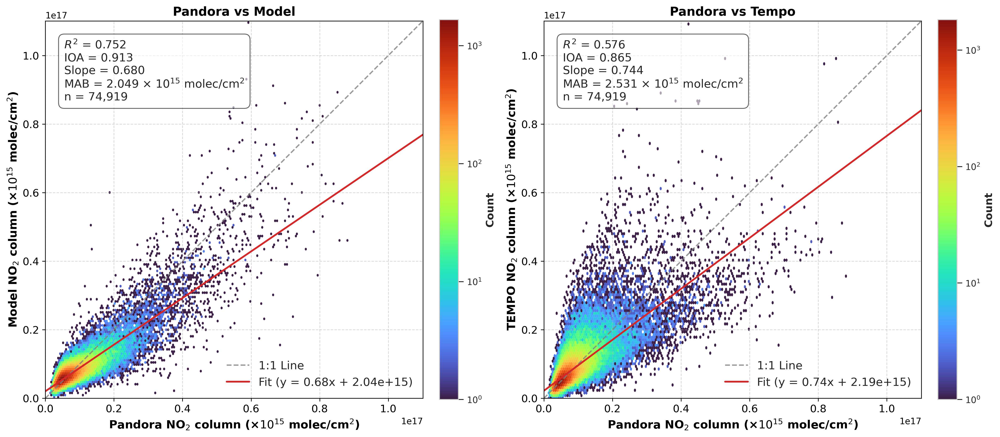

In [5]:

k_foldpath = '../runs/albation/K_fold_0'
k_df = pd.read_csv(os.path.join(k_foldpath, 'metrics', 'all_metrics.csv')).drop(columns=['Unnamed: 0'])

ffig,_, metrics_return_0 = plot_all(k_foldpath)


ffig.savefig(os.path.join(plot_path, 'K_fold_0.png'), dpi=600, bbox_inches='tight')

In [6]:


# k_foldpath = '/tng4/users/skayasth/Yearly/2025/Apr/Tempo_Results/Final_training/runs/albation/K_fold_001'
# k_df = pd.read_csv(os.path.join(k_foldpath, 'metrics', 'all_metrics.csv')).drop(columns=['Unnamed: 0'])

# ffig,_, metrics_return_1 = plot_all(k_foldpath)
# ffig.savefig(os.path.join(plot_path, 'K_fold_001.png'), dpi=600, bbox_inches='tight')


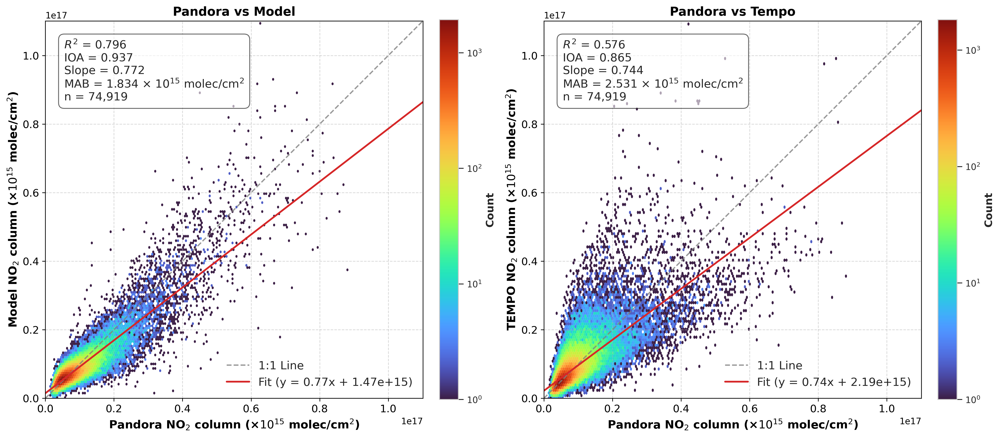

In [14]:
k_foldpath = '../runs/albation/K_fold_0025'
k_df = pd.read_csv(os.path.join(k_foldpath, 'metrics', 'all_metrics.csv')).drop(columns=['Unnamed: 0'])
ffig,_, metrics_return_2 = plot_all(k_foldpath)
ffig.savefig(os.path.join(plot_path, 'K_fold_0025.png'), dpi=600, bbox_inches='tight')
# metrics_return_2

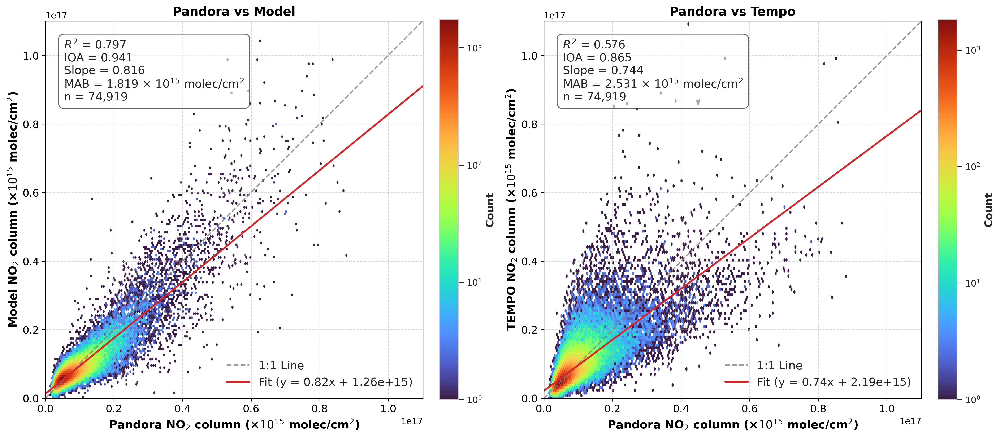

In [7]:
k_foldpath = '../runs/albation/K_fold_005'
k_df = pd.read_csv(os.path.join(k_foldpath, 'metrics', 'all_metrics.csv')).drop(columns=['Unnamed: 0'])
ffig,_, metrics_return_2 = plot_all(k_foldpath)
ffig.savefig(os.path.join(plot_path, 'K_fold_005.png'), dpi=600, bbox_inches='tight')
# metrics_return_2

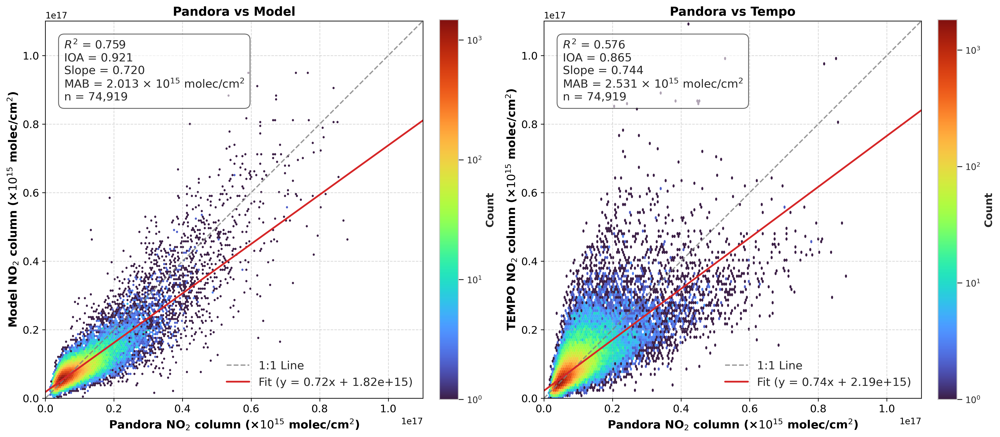

In [8]:
k_foldpath = '../runs/albation/K_fold_0075'
k_df = pd.read_csv(os.path.join(k_foldpath, 'metrics', 'all_metrics.csv')).drop(columns=['Unnamed: 0'])
ffig,_, metrics_return_2 = plot_all(k_foldpath)

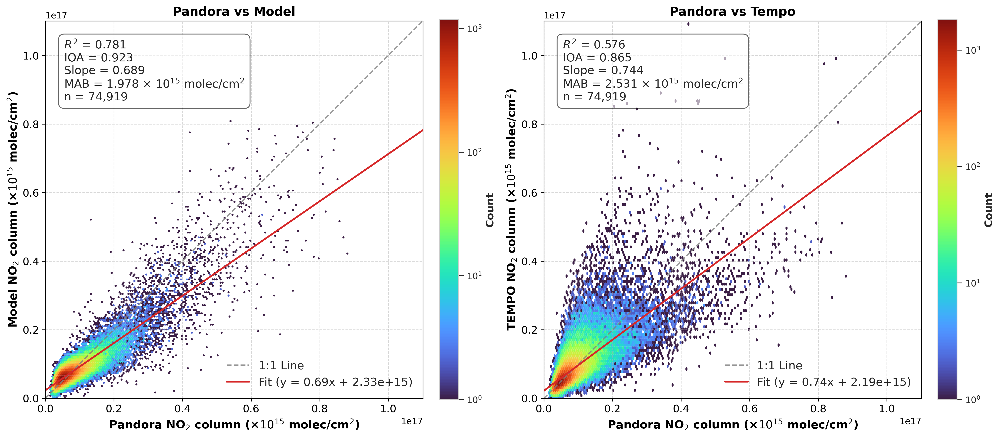

In [9]:

k_foldpath = '../runs/albation/K_fold_mlp'
k_df = pd.read_csv(os.path.join(k_foldpath, 'metrics', 'all_metrics.csv')).drop(columns=['Unnamed: 0'])
ffig,_, metrics_return_mlp = plot_all(k_foldpath)
ffig.savefig(os.path.join(plot_path, 'K_fold_mlp.png'), dpi=600, bbox_inches='tight')

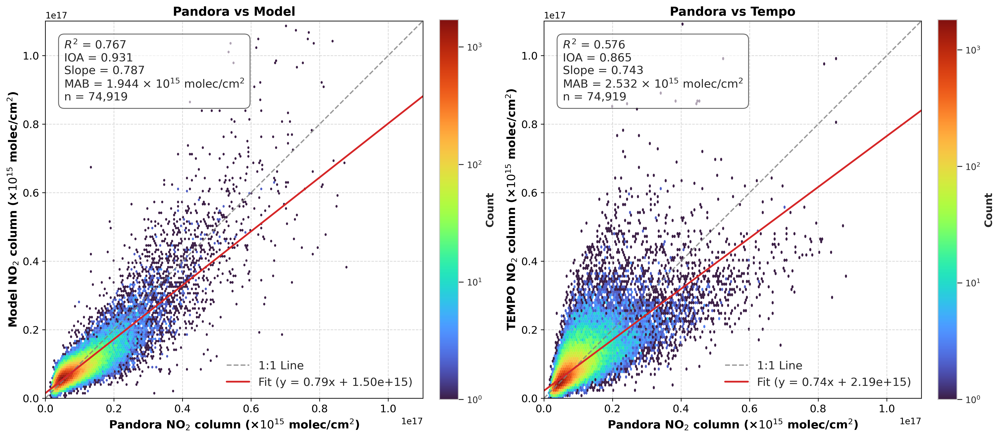

In [10]:

k_foldpath = '../runs/albation/K_fold_nofno'
k_df = pd.read_csv(os.path.join(k_foldpath, 'metrics', 'all_metrics.csv')).drop(columns=['Unnamed: 0'])
ffig,_, metrics_return_nofno = plot_all(k_foldpath)
ffig.savefig(os.path.join(plot_path, 'K_fold_nofno.png'), dpi=600, bbox_inches='tight')

In [11]:
final_df = {
    'H_model_lambda_0': metrics_return_0,
    # 'H_model_lambda_001': metrics_return_1,
    'H_model_lambda_005': metrics_return_2,
    'H_model_no_transformer': metrics_return_mlp,
    'H_model_no_fno': metrics_return_nofno,
}
albation_df = pd.DataFrame(final_df).T
albation_df

,r2_model,r2_tempo,slope_model,slope_tempo,ioa_model,ioa_tempo,mab_model,mab_tempo,rmse_model,rmse_tempo,nmab_model,nmab_tempo,nrmse_model,nrmse_tempo
H_model_lambda_0,0.752423,0.576105,0.680124,0.743541,0.912968,0.865172,2.049185,2.530644,3.295238,4.418147,0.249184,0.307731,0.400706,0.537254
H_model_lambda_005,0.758672,0.576105,0.719653,0.743541,0.921313,0.865172,2.013394,2.530644,3.206314,4.418147,0.244832,0.307731,0.389893,0.537254
H_model_no_transformer,0.780730,0.576105,0.689343,0.743541,0.923379,0.865172,1.977715,2.530644,3.089612,4.418147,0.240493,0.307731,0.375702,0.537254
H_model_no_fno,0.767166,0.575598,0.786922,0.743067,0.931186,0.864962,1.944123,2.532201,3.115087,4.421672,0.236403,0.307912,0.378790,0.537669


# Group Fold

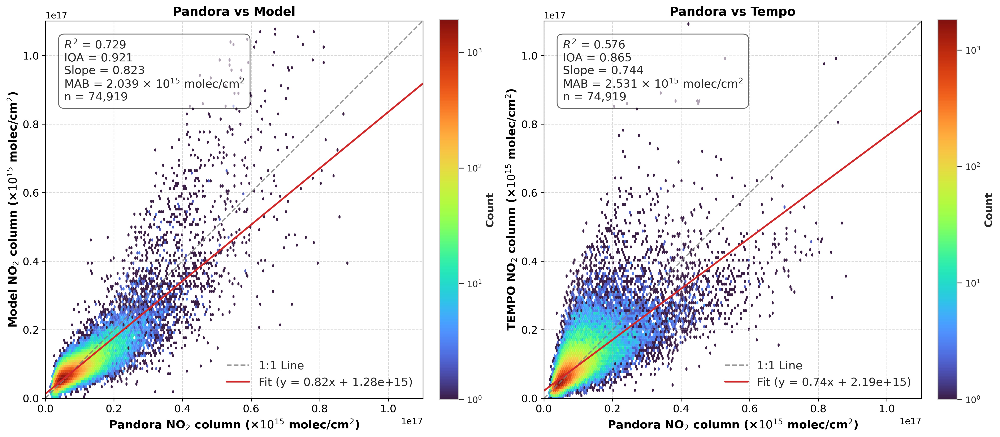

In [12]:

g_foldpath = '../runs/albation/G_fold_001'
g_df = pd.read_csv(os.path.join(g_foldpath, 'metrics', 'all_metrics.csv')).drop(columns=['Unnamed: 0'])

ffig,_, metrics_return_g1 = plot_all(g_foldpath)
ffig.savefig(os.path.join(plot_path, 'G_fold_001.png'), dpi=600, bbox_inches='tight')

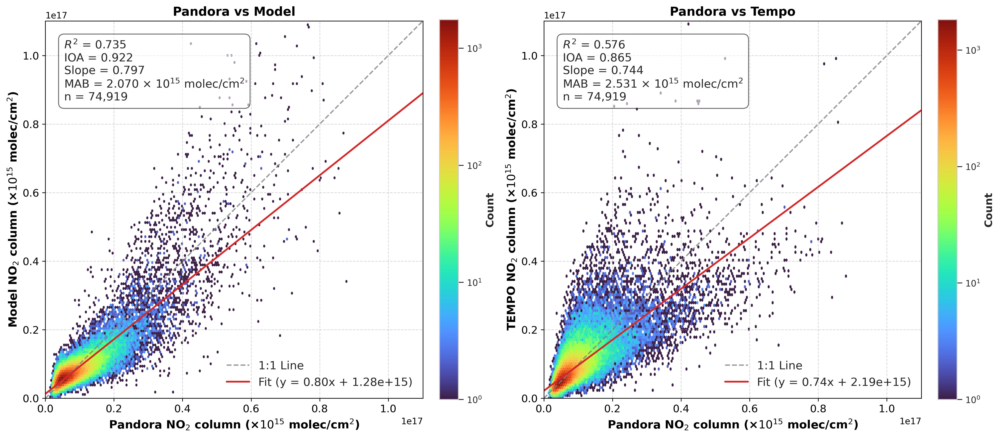

In [13]:

g_foldpath = '../runs/albation/G_fold_005'
g_df = pd.read_csv(os.path.join(g_foldpath, 'metrics', 'all_metrics.csv')).drop(columns=['Unnamed: 0'])

ffig,_, metrics_return_g5 = plot_all(g_foldpath)
ffig.savefig(os.path.join(plot_path, 'G_fold_001.png'), dpi=600, bbox_inches='tight')

# metrics_return_g5